# Unet Implementation

## Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load Dataset and extract

In [2]:
!unzip /content/drive/MyDrive/Crop_Row_Detection_Dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_200.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_2000.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_2200.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_2400.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_2800.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_3200.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_3400.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_3600.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_3800.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_400.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_600.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_800.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_600_0.tif  
  inflating: Crop Row Detection D

## Reconstruction of dataset into a new format

In [3]:
import os
from PIL import Image
from tqdm import tqdm

# Define paths
base_path = '/content/Crop Row Detection Dataset'
new_train_path = './stage1_train'
new_test_path = './stage1_test'

# Create new directories
os.makedirs(new_train_path, exist_ok=True)
os.makedirs(new_test_path, exist_ok=True)

# Helper function to create the new structure
def restructure_data(old_path, new_path, subset):
    img_dir = os.path.join(old_path, subset, 'Images', '0')
    mask_dir = os.path.join(old_path, subset, 'Masks', '0')

    for filename in tqdm(os.listdir(img_dir)):
        if filename.endswith('.tif'):
            file_id = filename.split('.')[0]
            new_dir = os.path.join(new_path, file_id)
            os.makedirs(os.path.join(new_dir, 'images'), exist_ok=True)
            os.makedirs(os.path.join(new_dir, 'masks'), exist_ok=True)

            # Read and save image using Pillow
            img = Image.open(os.path.join(img_dir, filename))
            img.save(os.path.join(new_dir, 'images', f'{file_id}.png'))

            # Read and save mask using Pillow
            mask = Image.open(os.path.join(mask_dir, filename))
            mask.save(os.path.join(new_dir, 'masks', f'{file_id}.png'))

# Restructure train and test data
restructure_data(base_path, new_train_path, 'train')
restructure_data(base_path, new_test_path, 'test')



100%|██████████| 509/509 [01:14<00:00,  6.81it/s]


Resizing training images and masks


100%|██████████| 4071/4071 [03:41<00:00, 18.38it/s]


Resizing test images


100%|██████████| 509/509 [00:22<00:00, 23.02it/s]


Done!


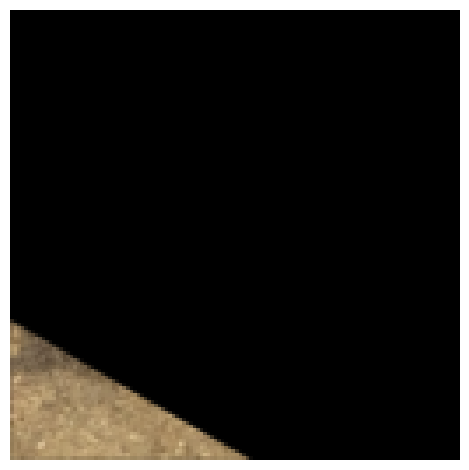

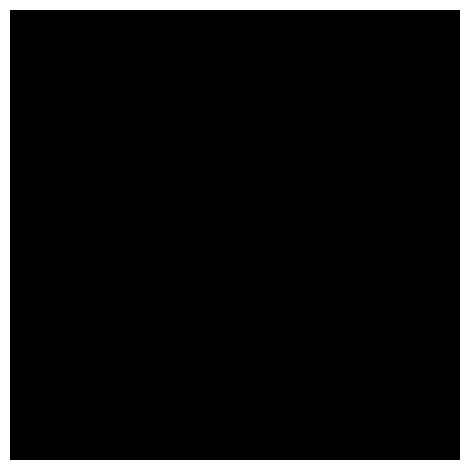

In [9]:
import tensorflow as tf
import os
import random
import numpy as np
from tqdm import tqdm
from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

seed = 42
np.random.seed = seed

IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

TRAIN_PATH = './stage1_train/'
TEST_PATH = './stage1_test/'

train_ids = next(os.walk(TRAIN_PATH))[1]
test_ids = next(os.walk(TEST_PATH))[1]

X = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
y = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)

__author__ = "Sreenivas Bhattiprolu"
__license__ = "Feel free to copy, I appreciate if you acknowledge Python for Microscopists"

# Credits https://github.com/bnsreenu/python_for_microscopists

"""
@author: Sreenivas Bhattiprolu
"""

print('Resizing training images and masks')
for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):
    path = TRAIN_PATH + id_
    img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNELS]
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X[n] = img  #Fill empty X_train with values from img
    mask = np.zeros((IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)
    for mask_file in next(os.walk(path + '/masks/'))[2]:
        mask_ = imread(path + '/masks/' + mask_file)
        if mask_.ndim == 3 and mask_.shape[2] == 3:
            mask_ = mask_[:,:,0]  # Convert 3-channel mask to single channel if necessary
        mask_ = np.expand_dims(resize(mask_, (IMG_HEIGHT, IMG_WIDTH), mode='constant',
                                      preserve_range=True), axis=-1)
        mask = np.maximum(mask, mask_)

    y[n] = mask

# test images
test_images = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
sizes_test = []
print('Resizing test images')
for n, id_ in tqdm(enumerate(test_ids), total=len(test_ids)):
    path = TEST_PATH + id_
    img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNELS]
    sizes_test.append([img.shape[0], img.shape[1]])
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    test_images[n] = img

print('Done!')

# Split into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.33, random_state=42)

# Visualize random sample from training set
image_x = random.randint(0, len(X_train) - 1)
plt.axis("off")
imshow(X_train[image_x])
plt.show()
plt.axis("off")
imshow(np.squeeze(y_train[image_x]))
plt.show()


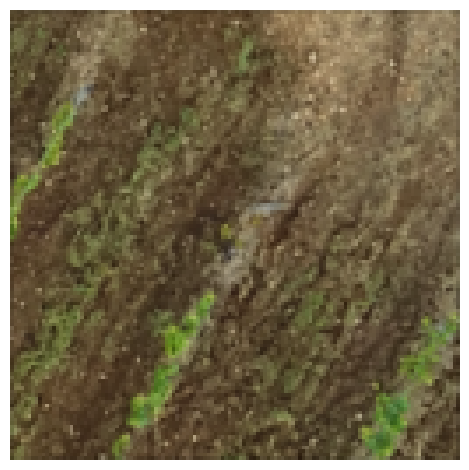

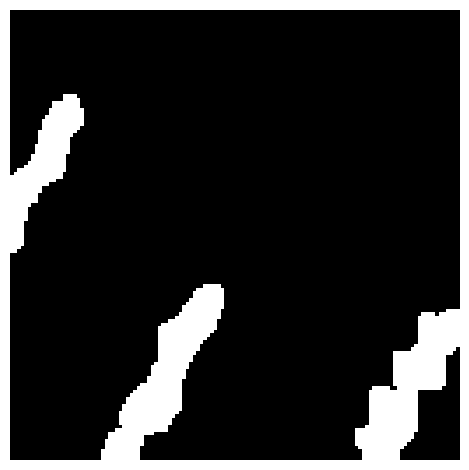

In [10]:
# Visualize random sample from training set
image_x = random.randint(0, len(X_train) - 1)
plt.axis("off")
imshow(X_train[image_x])
plt.show()
plt.axis("off")
imshow(np.squeeze(y_train[image_x]))
plt.show()


## Model Definition

In [11]:
import tensorflow as tf
import os
import random
import numpy as np
from tqdm import tqdm
from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Parameters
num_classes = 1

# Define the model
inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

# Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
b1 = tf.keras.layers.BatchNormalization()(c1)
r1 = tf.keras.layers.ReLU()(b1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(r1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
b2 = tf.keras.layers.BatchNormalization()(c2)
r2 = tf.keras.layers.ReLU()(b2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(r2)

c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
b3 = tf.keras.layers.BatchNormalization()(c3)
r3 = tf.keras.layers.ReLU()(b3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(r3)

c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
b4 = tf.keras.layers.BatchNormalization()(c4)
r4 = tf.keras.layers.ReLU()(b4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(r4)

c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
b5 = tf.keras.layers.BatchNormalization()(c5)
r5 = tf.keras.layers.ReLU()(b5)
c5 = tf.keras.layers.Dropout(0.3)(r5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

# Expansive path
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
u6 = tf.keras.layers.BatchNormalization()(u6)
u6 = tf.keras.layers.ReLU()(u6)

u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(u6)
u7 = tf.keras.layers.concatenate([u7, c3])
u7 = tf.keras.layers.BatchNormalization()(u7)
u7 = tf.keras.layers.ReLU()(u7)

u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(u7)
u8 = tf.keras.layers.concatenate([u8, c2])
u8 = tf.keras.layers.BatchNormalization()(u8)
u8 = tf.keras.layers.ReLU()(u8)

u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(u8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
u9 = tf.keras.layers.BatchNormalization()(u9)
u9 = tf.keras.layers.ReLU()(u9)

outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='sigmoid')(u9)

model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 16)         448       ['input_1[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 128, 128, 16)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 16)         2320      ['dropout[0][0]']             
                                                                                              

In [12]:
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


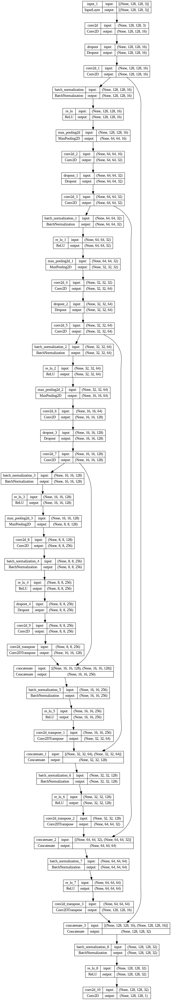

In [13]:
tf.keras.utils.plot_model(model, "model.png", show_shapes=True)


In [14]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
    tf.keras.callbacks.TensorBoard(log_dir='logs')
]


## Model Training

In [23]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    batch_size=8,
    epochs=50,
    callbacks=callbacks
)


Epoch 1/50
341/341 [==============================] - 8s 24ms/step - loss: 0.0981 - accuracy: 0.9585 - val_loss: 0.0950 - val_accuracy: 0.9598
Epoch 2/50
341/341 [==============================] - 9s 25ms/step - loss: 0.0964 - accuracy: 0.9592 - val_loss: 0.0923 - val_accuracy: 0.9608
Epoch 3/50
341/341 [==============================] - 8s 24ms/step - loss: 0.0933 - accuracy: 0.9603 - val_loss: 0.0898 - val_accuracy: 0.9621
Epoch 4/50
341/341 [==============================] - 9s 26ms/step - loss: 0.0928 - accuracy: 0.9604 - val_loss: 0.0931 - val_accuracy: 0.9599
Epoch 5/50
341/341 [==============================] - 8s 23ms/step - loss: 0.0907 - accuracy: 0.9613 - val_loss: 0.0861 - val_accuracy: 0.9631
Epoch 6/50
341/341 [==============================] - 8s 24ms/step - loss: 0.0895 - accuracy: 0.9617 - val_loss: 0.0866 - val_accuracy: 0.9629
Epoch 7/50
341/341 [==============================] - 8s 23ms/step - loss: 0.0902 - accuracy: 0.9616 - val_loss: 0.0861 - val_accuracy: 0.9630

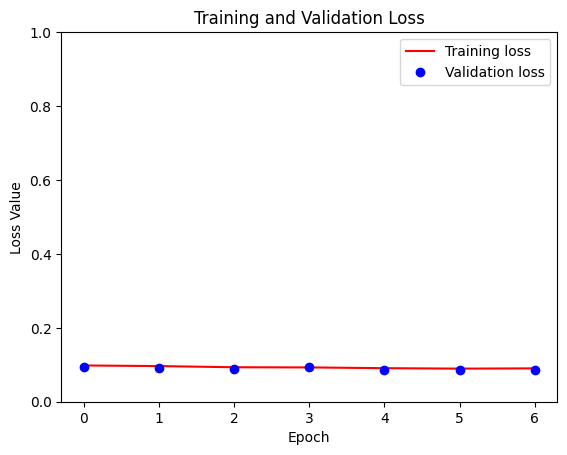

In [24]:
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure()
plt.plot(loss, 'r', label='Training loss')
plt.plot(val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()


## Display Predictions

In [25]:
def display(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()


1/1 [==============================] - 0s 18ms/step


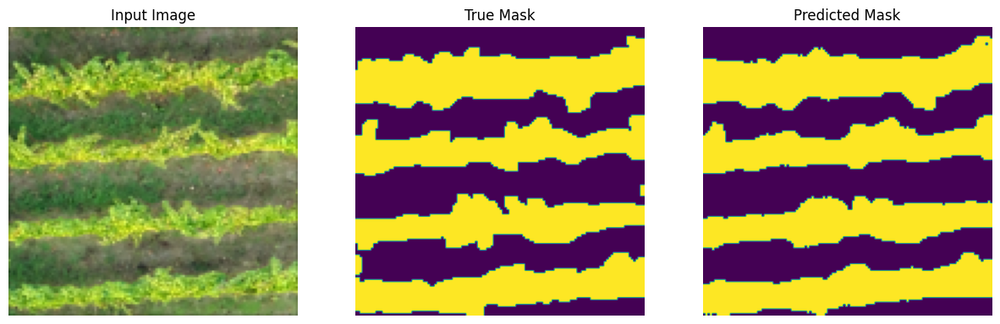

In [26]:
i = random.randint(0, len(X_val) - 1)  # Select a random sample from the validation set
sample_image = X_val[i]
sample_mask = y_val[i]
prediction = model.predict(sample_image[tf.newaxis, ...])[0]
predicted_mask = (prediction > 0.5).astype(np.uint8)

display([sample_image, sample_mask, predicted_mask])


## Display multiple Predictions

1/1 [==============================] - 0s 31ms/step


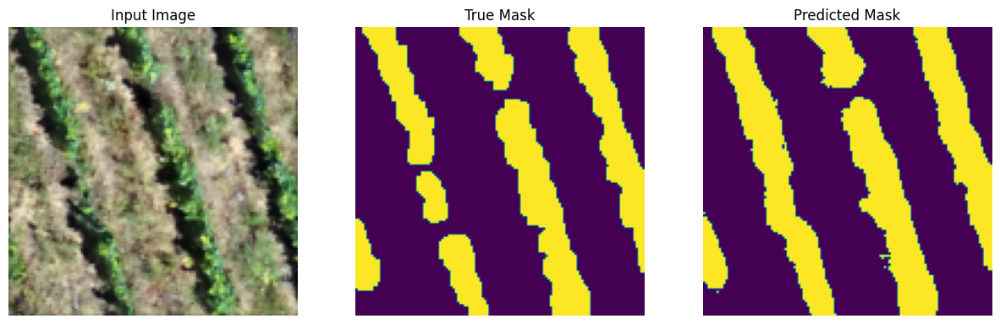

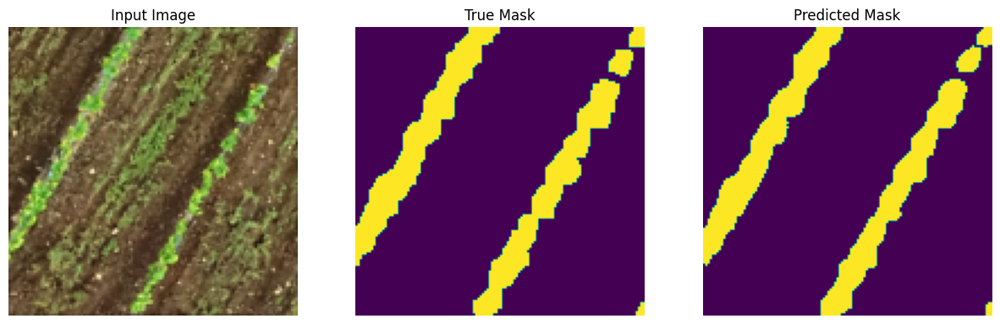

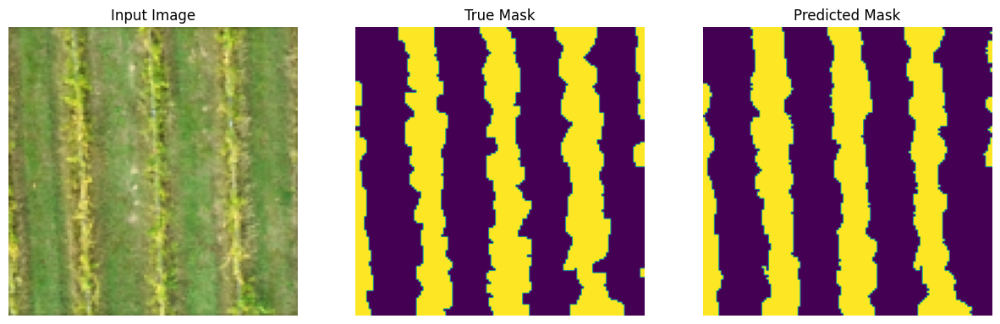

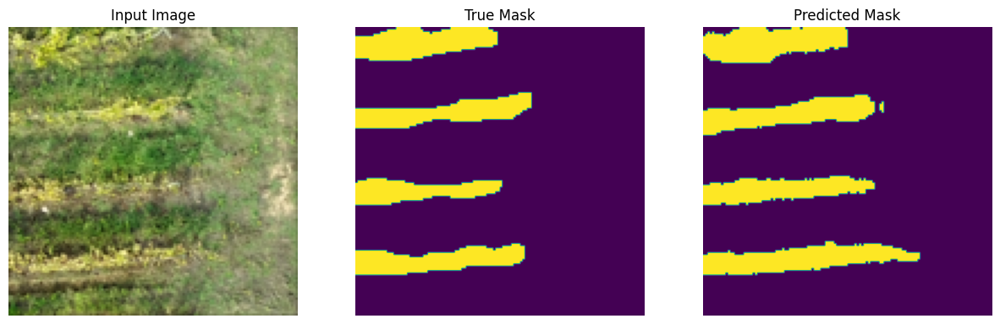

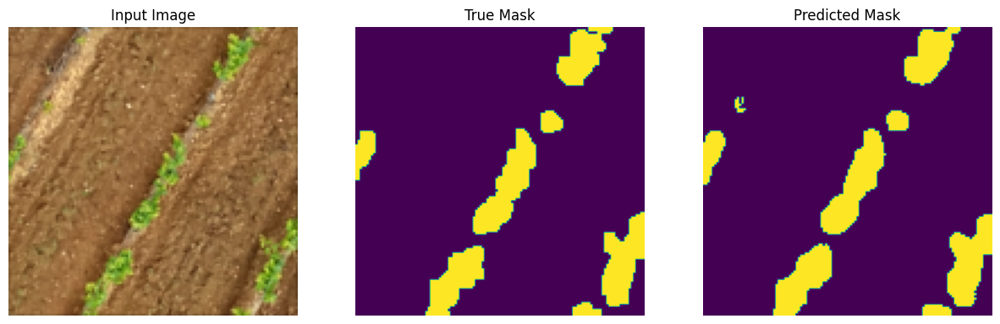

...

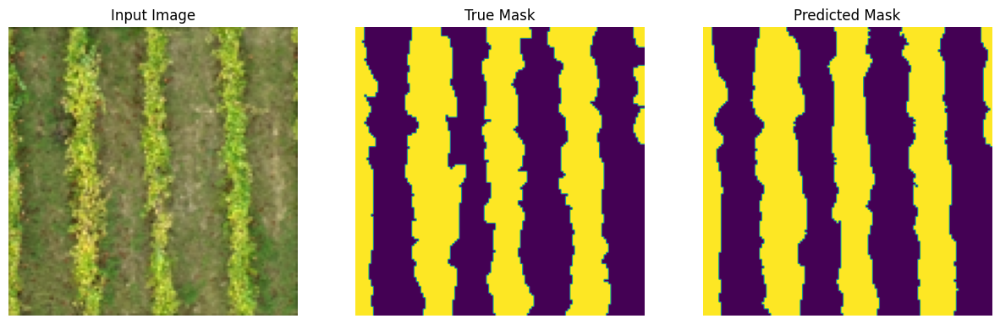

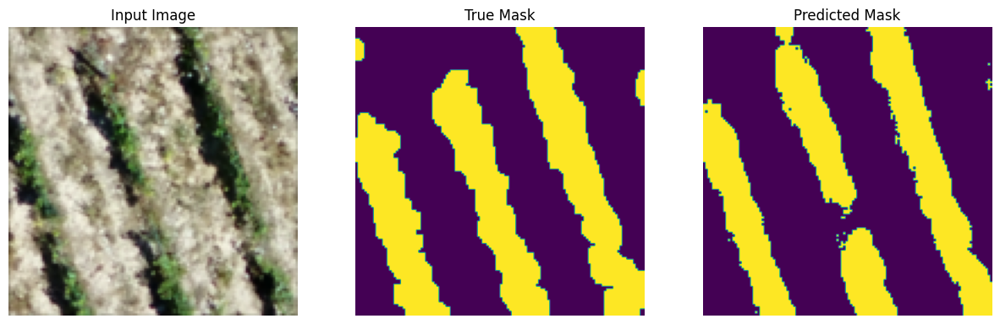

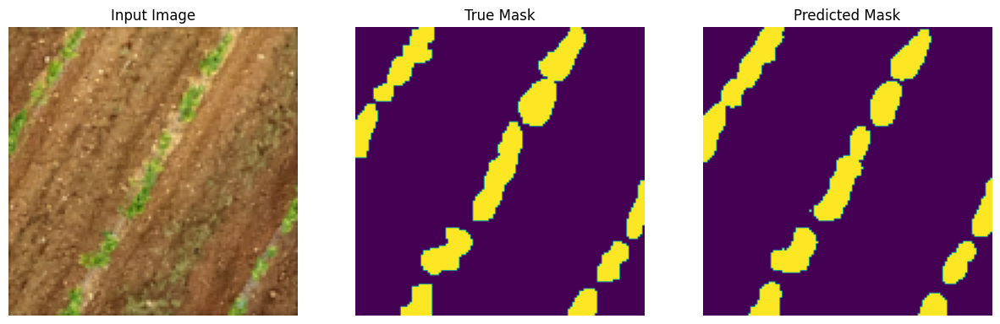

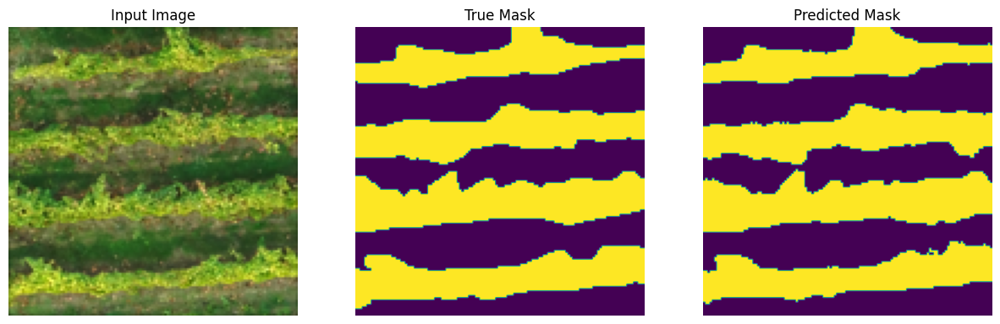

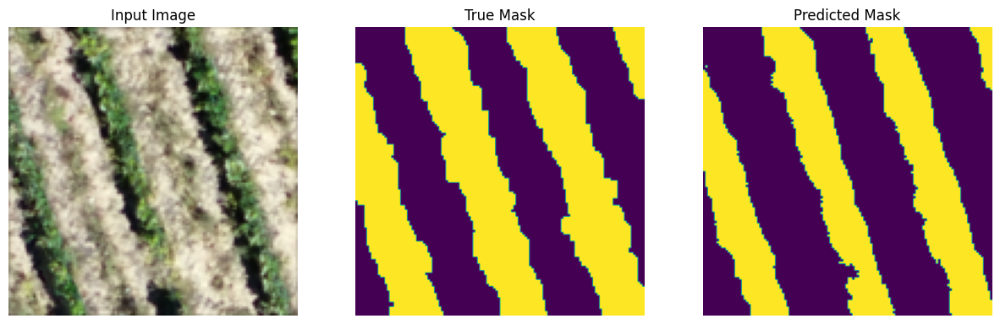

In [29]:
# Function to display multiple predictions
def display_multiple_predictions(display_list, num_samples=50):
    for idx in range(num_samples):
        plt.figure(figsize=(15, 5))

        sample_image = display_list[idx][0]
        sample_mask = display_list[idx][1]
        predicted_mask = display_list[idx][2]

        plt.subplot(1, 3, 1)
        plt.title('Input Image')
        plt.imshow(tf.keras.utils.array_to_img(sample_image))
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title('True Mask')
        plt.imshow(tf.keras.utils.array_to_img(sample_mask))
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title('Predicted Mask')
        plt.imshow(tf.keras.utils.array_to_img(predicted_mask))
        plt.axis('off')

        plt.show()

# Select 50 random samples from the validation set
num_samples = 50
indices = random.sample(range(len(X_val)), num_samples)
sample_predictions = []

for i in indices:
    sample_image = X_val[i]
    sample_mask = y_val[i]
    prediction = model.predict(sample_image[tf.newaxis, ...])[0]
    predicted_mask = (prediction > 0.5).astype(np.uint8)
    sample_predictions.append((sample_image, sample_mask, predicted_mask))

# Display the predictions
display_multiple_predictions(sample_predictions, num_samples)


## Save and download the Model

In [27]:
# Save the entire model
model.save('crop_row_detection_model.h5')


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [28]:
from google.colab import files

# Download the model
files.download('crop_row_detection_model.h5')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>